In [38]:
import numpy as np
from utils.visualization import *
import matplotlib.pyplot as plt
from utils.helpers import *

In [39]:
y_1 = np.load("../../HyperDimRed/data/labels/sagar/ratings_1.npy")
y_2 = np.load("../../HyperDimRed/data/labels/sagar/ratings_2.npy")
y_3 = np.load("../../HyperDimRed/data/labels/sagar/ratings_3.npy")  

# Hyperbolic embedding

In [3]:
epch = 1000

dataset_name = 'sagar'
data_type = 'labels'
representation_name = 'pom'
batch_size = 480
lr = 0.1
seed = 5
model_name = 'mds'
latent_dist_fun = 'poincare'
distance_method = 'euclidean'
temperature = 0.1
n_neighbors = 20
epsilon = 10.0

optimizer='PoincareRiemannianAdamOptim'

roi = None
subject = [1,2,3]

X=np.load(f"results_ChemicalSenses_experiments_Sagar/original/embeddings_{epch}_{dataset_name}_{data_type}_{representation_name}_{batch_size}_"f"{lr}_{seed}_{model_name}_{latent_dist_fun}_{distance_method}_{temperature}_{n_neighbors}_{epsilon}_{optimizer}_{roi}_{subject}.npy") 
print(f"results_ChemicalSenses_experiments_Sagar/original/embeddings_{epch}_{dataset_name}_{data_type}_{representation_name}_{batch_size}_"f"{lr}_{seed}_{model_name}_{latent_dist_fun}_{distance_method}_{temperature}_{n_neighbors}_{epsilon}_{optimizer}_{roi}_{subject}.npy")  

results_ChemicalSenses_experiments_Sagar/original/embeddings_1000_sagar_labels_pom_480_0.1_5_mds_poincare_euclidean_0.1_20_10.0_PoincareRiemannianAdamOptim_None_[1, 2, 3].npy


In [1]:
plt.figure(figsize=(6, 6))
plt.scatter(X[:, 0], X[:, 1], s=5, alpha=0.8)
plt.show()

In [4]:
base_dir = '/xxx/HyperDimRed/data/'
input_embeddings = f'embeddings/{representation_name}/{dataset_name}_{representation_name}_embeddings_13_Apr17.csv'

In [5]:
figs_path = "figs2_june2026_sagar/entropy/"

### Averaged-rating

In [ ]:
# Average

epch = 1000 #1000 or 500

dataset_name = 'sagar'
data_type = 'labels'
representation_name = 'pom'
batch_size = 480
lr = 0.1
seed = 5
model_name = 'mds'
latent_dist_fun = 'poincare'
distance_method = 'euclidean'
temperature = 0.1
n_neighbors = 20
epsilon = 10.0

threshold = 0.3

optimizer='PoincareRiemannianAdamOptim'

roi = None
subject = None

X=np.load(f"results_ChemicalSenses_experiments_Sagar/average_original/embeddings_1000_sagar_labels_pom_125_0.1_5_mds_poincare_euclidean_0.1_20_10.0_PoincareRiemannianAdamOptim_None_None_None_0.3.npy") 

In [46]:
embeddings, labels,subjects,CIDs = read_embeddings(base_dir,
                                                   select_descriptors(dataset_name),
                                                   input_embeddings,
                                                   grand_avg=True if (dataset_name == 'keller' or (dataset_name == 'sagar' and subject==None)) else False)

Entropy method: softmax
Number of valid samples: 125 / 125
Pearson r  = -0.7708, p = 7.609e-26
Spearman ρ = -0.7210, p = 2.504e-21


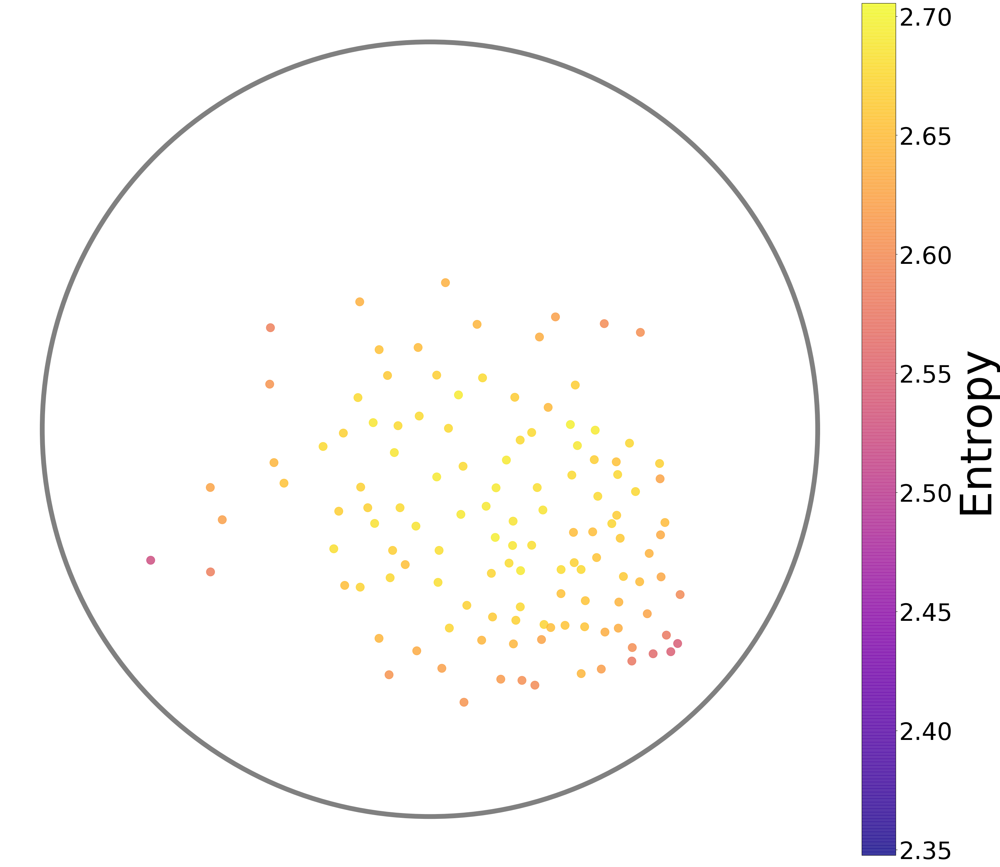

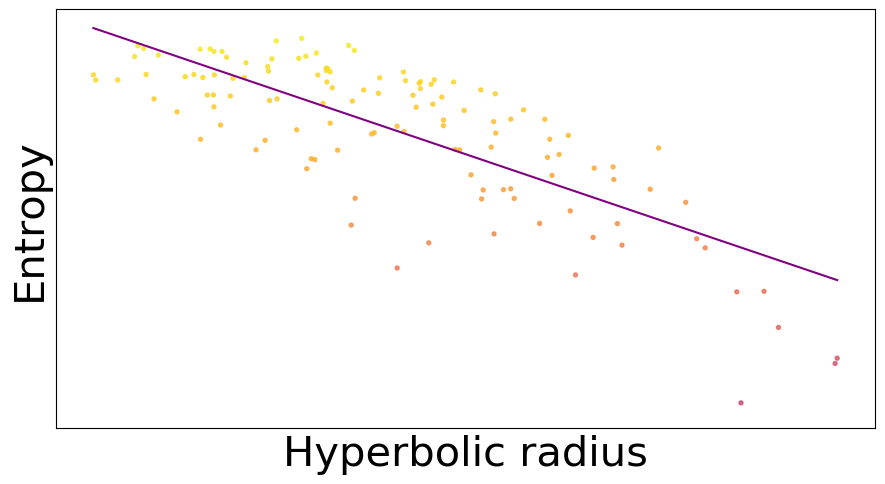

In [52]:
X_torch = torch.tensor(X, dtype=torch.float32)

radius = poincare_distance(
    X_torch,
    torch.zeros((1, 2))
)

results = plot_embedding_entropy_and_radius_correlation2(
    X=X,
    y=labels,
    radius=radius,
    entropy_method="softmax",
    normalize_entropy=False,
    point_size=8,
    draw_unit_circle=True,
    save_embedding_path="results_ChemicalSenses_experiments_Sagar/entropy_embedding_average.pdf",
    save_correlation_path="results_ChemicalSenses_experiments_Sagar/entropy_radius_correlation_average.pdf",
    entropy_vmin=entropy_vmin,
    entropy_vmax=entropy_vmax
)

### Union

In [24]:
embeddings, labels,subjects,CIDs = read_embeddings(base_dir,
                                                   select_descriptors(dataset_name),
                                                   input_embeddings,
                                                   grand_avg=True if (dataset_name == 'keller' or (dataset_name == 'sagar' and subject==None)) else False)

In [25]:
H_union = compute_label_entropy(
    labels,
    method="softmax",
    normalize=False,
    temperature=1.0,
)

entropy_vmin = np.nanmin(H_union)
entropy_vmax = np.nanmax(H_union)

print(entropy_vmin, entropy_vmax)

2.347583820250124 2.7054476566115886


Entropy method: softmax
Number of valid samples: 480 / 480
Pearson r  = -0.8151, p = 2.124e-115
Spearman ρ = -0.7795, p = 3.560e-99


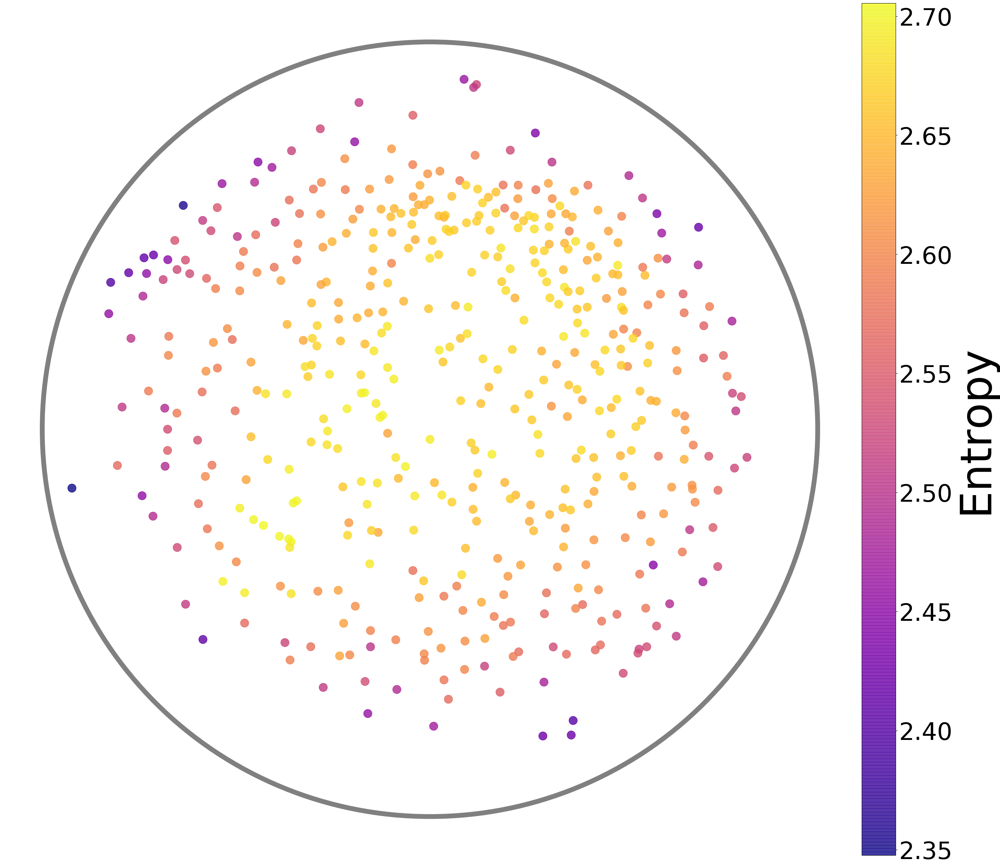

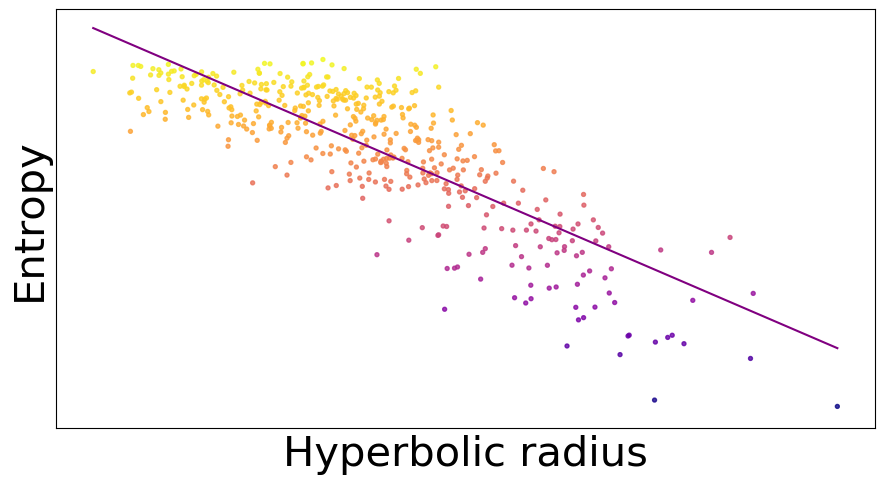

In [87]:
X_torch = torch.tensor(X, dtype=torch.float32)

radius = poincare_distance(
    X_torch,
    torch.zeros((1, 2))
)

results = plot_embedding_entropy_and_radius_correlation2(
    X,
    y=labels,
    radius=radius,
    entropy_method="softmax",
    normalize_entropy=False,
    draw_unit_circle=True,
    save_embedding_path="results_ChemicalSenses_experiments_Sagar/entropy_embedding.png",
    save_correlation_path="results_ChemicalSenses_experiments_Sagar/entropy_radius_correlation.png",
)

### Subject 1

In [27]:
embeddings, labels, CIDs, subjects = select_subjects(subjects,
                                                     X,
                                                     labels,
                                                     CIDs,
                                                     subjects.unique(),
                                                     subject_id=1,
                                                     n_subject=None) 

Entropy method: softmax
Number of valid samples: 160 / 160
Pearson r  = -0.7803, p = 5.093e-34
Spearman ρ = -0.7782, p = 9.617e-34


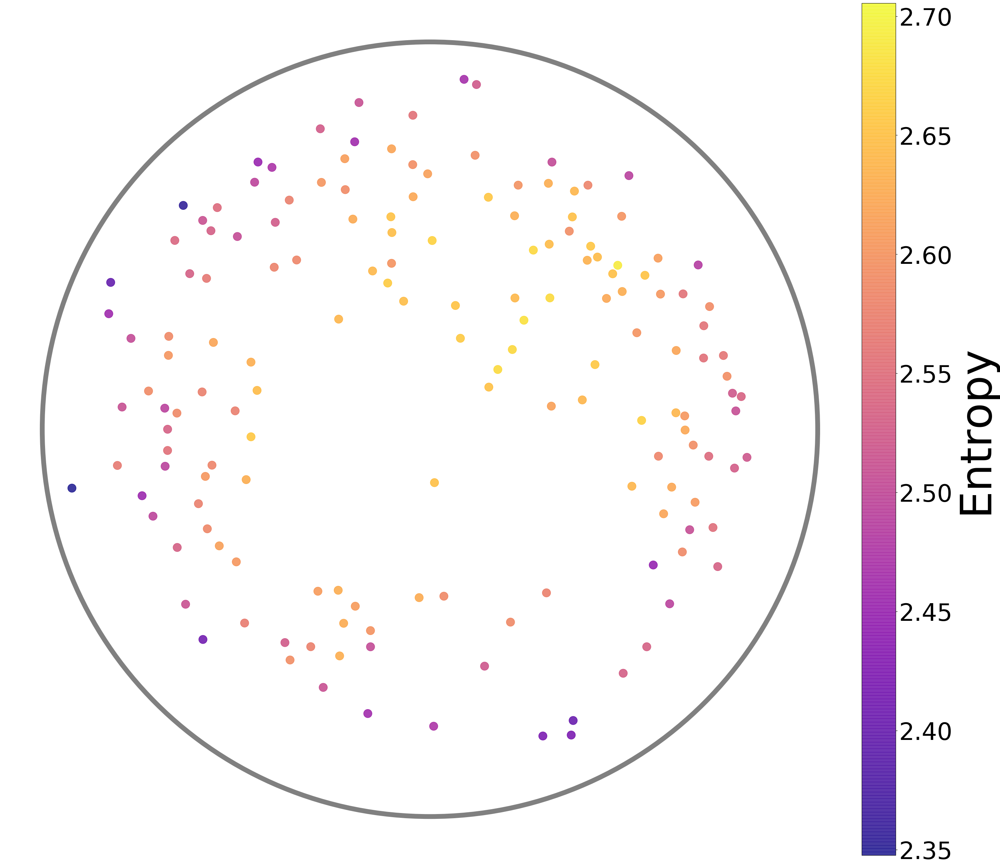

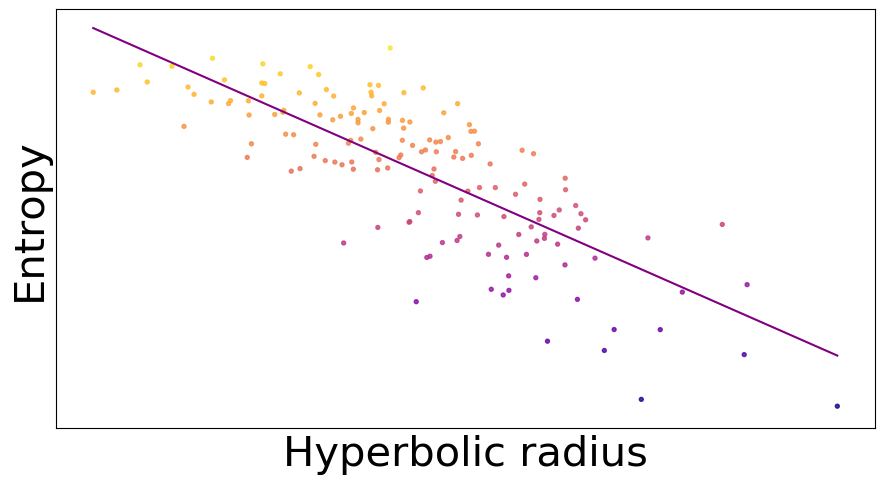

In [29]:
X_torch = torch.tensor(embeddings, dtype=torch.float32)

radius = poincare_distance(
    X_torch,
    torch.zeros((1, 2))
)

results = plot_embedding_entropy_and_radius_correlation2(
    X=embeddings,
    y=labels,
    radius=radius,
    entropy_method="softmax",
    normalize_entropy=False,
    draw_unit_circle=True,
    save_embedding_path="results_ChemicalSenses_experiments_Sagar/entropy_embedding_subject1.png",
    save_correlation_path="results_ChemicalSenses_experiments_Sagar/entropy_radius_correlation_subject1.png",
    entropy_vmin=entropy_vmin,
    entropy_vmax=entropy_vmax
)

### Subject 2

In [30]:
embeddings, labels,subjects,CIDs = read_embeddings(base_dir,
                                                   select_descriptors(dataset_name),
                                                   input_embeddings,
                                                   grand_avg=True if (dataset_name == 'keller' or (dataset_name == 'sagar' and subject==None)) else False)

In [31]:
embeddings, labels, CIDs, subjects = select_subjects(subjects,
                                                     X,
                                                     labels,
                                                     CIDs,
                                                     subjects.unique(),
                                                     subject_id=2,
                                                     n_subject=None)

Entropy method: softmax
Number of valid samples: 160 / 160
Pearson r  = -0.8971, p = 6.175e-58
Spearman ρ = -0.8992, p = 1.393e-58


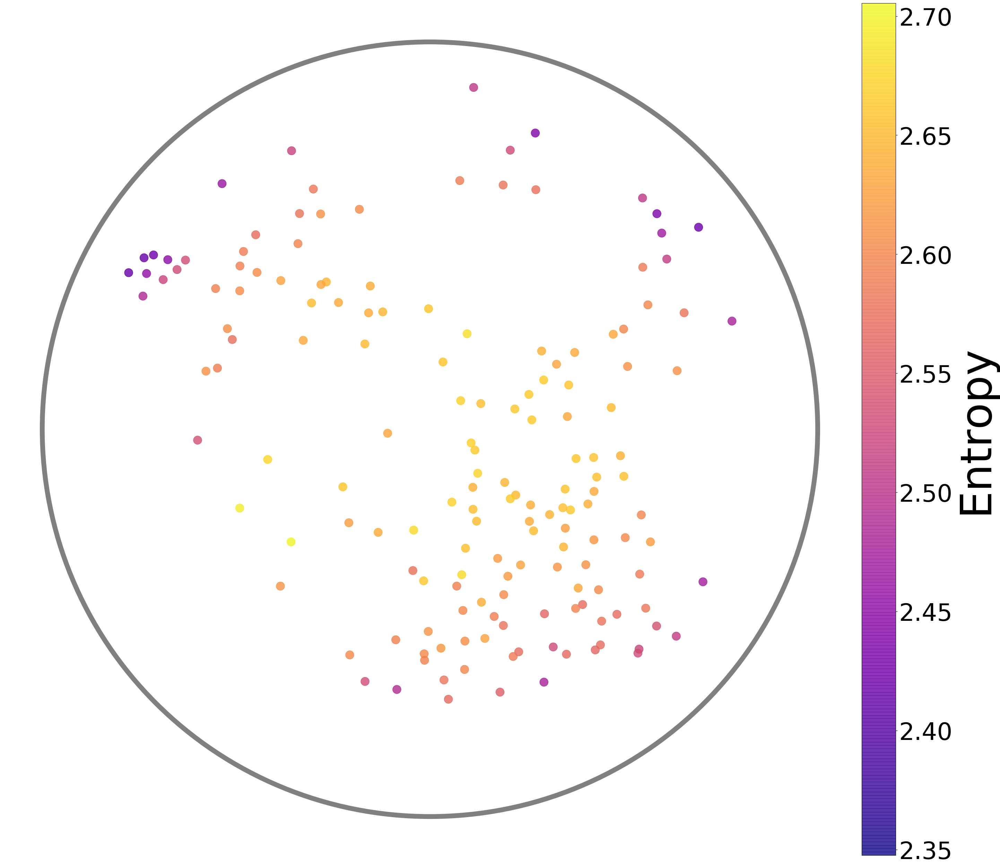

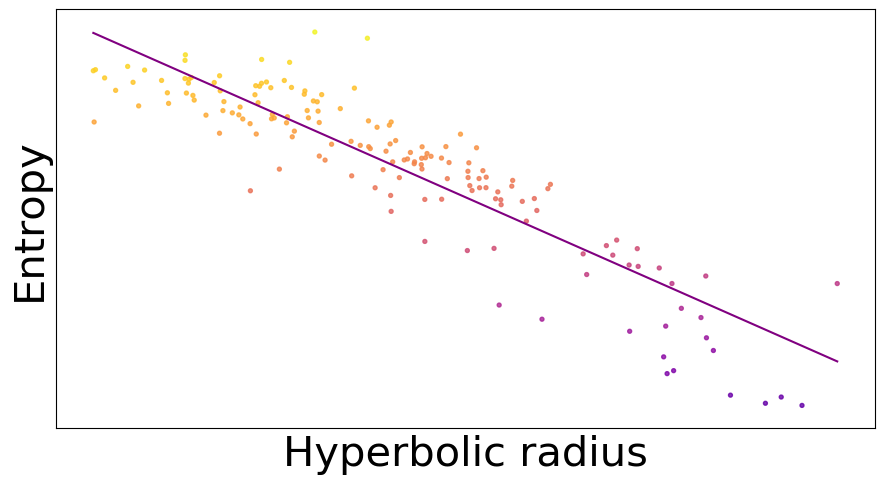

In [33]:
X_torch = torch.tensor(embeddings, dtype=torch.float32)

radius = poincare_distance(
    X_torch,
    torch.zeros((1, 2))
)

results = plot_embedding_entropy_and_radius_correlation2(
    X=embeddings,
    y=labels,
    radius=radius,
    entropy_method="softmax",
    normalize_entropy=False,
    draw_unit_circle=True,
    save_embedding_path="results_ChemicalSenses_experiments_Sagar/entropy_embedding_subject2.pdf",
    save_correlation_path="results_ChemicalSenses_experiments_Sagar/entropy_radius_correlation_subject2.pdf",
    entropy_vmin=entropy_vmin,
    entropy_vmax=entropy_vmax
)

### Subject 3

In [34]:
embeddings, labels,subjects,CIDs = read_embeddings(base_dir,
                                                   select_descriptors(dataset_name),
                                                   input_embeddings,
                                                   grand_avg=True if (dataset_name == 'keller' or (dataset_name == 'sagar' and subject==None)) else False)

In [35]:
embeddings, labels, CIDs, subjects = select_subjects(subjects,
                                                     X,
                                                     labels,
                                                     CIDs,
                                                     subjects.unique(),
                                                     subject_id=3,
                                                     n_subject=None)

Entropy method: softmax
Number of valid samples: 160 / 160
Pearson r  = -0.6447, p = 3.621e-20
Spearman ρ = -0.6612, p = 1.812e-21


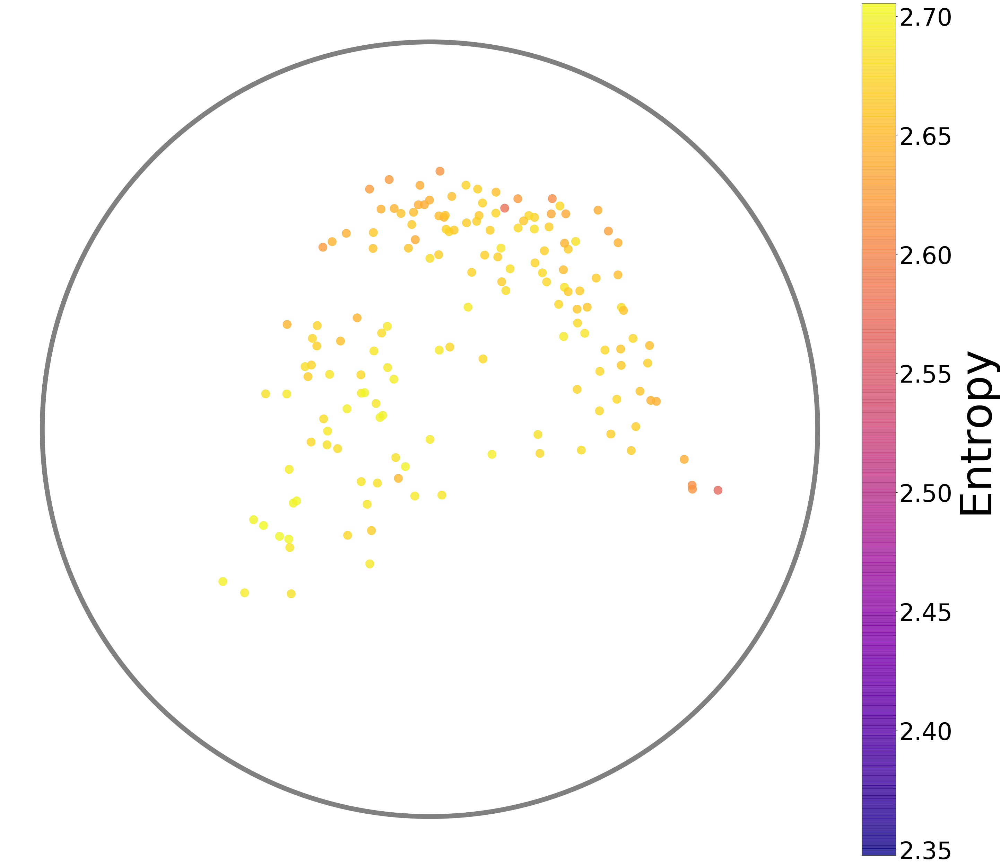

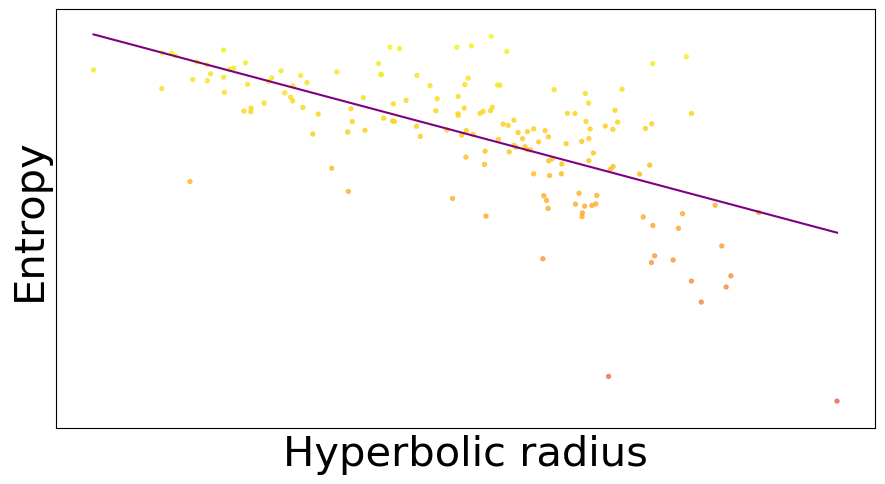

In [37]:
X_torch = torch.tensor(embeddings, dtype=torch.float32)

radius = poincare_distance(
    X_torch,
    torch.zeros((1, 2))
)

results = plot_embedding_entropy_and_radius_correlation2(
    X=embeddings,
    y=labels,
    radius=radius,
    entropy_method="softmax",
    normalize_entropy=False,
    draw_unit_circle=True,
    save_embedding_path="results_ChemicalSenses_experiments_Sagar/entropy_embedding_subject3.pdf",
    save_correlation_path="results_ChemicalSenses_experiments_Sagar/entropy_radius_correlation_subject3.pdf",
    entropy_vmin=entropy_vmin,
    entropy_vmax=entropy_vmax
)

# Labels

In [7]:
labels.shape 

torch.Size([480, 15])

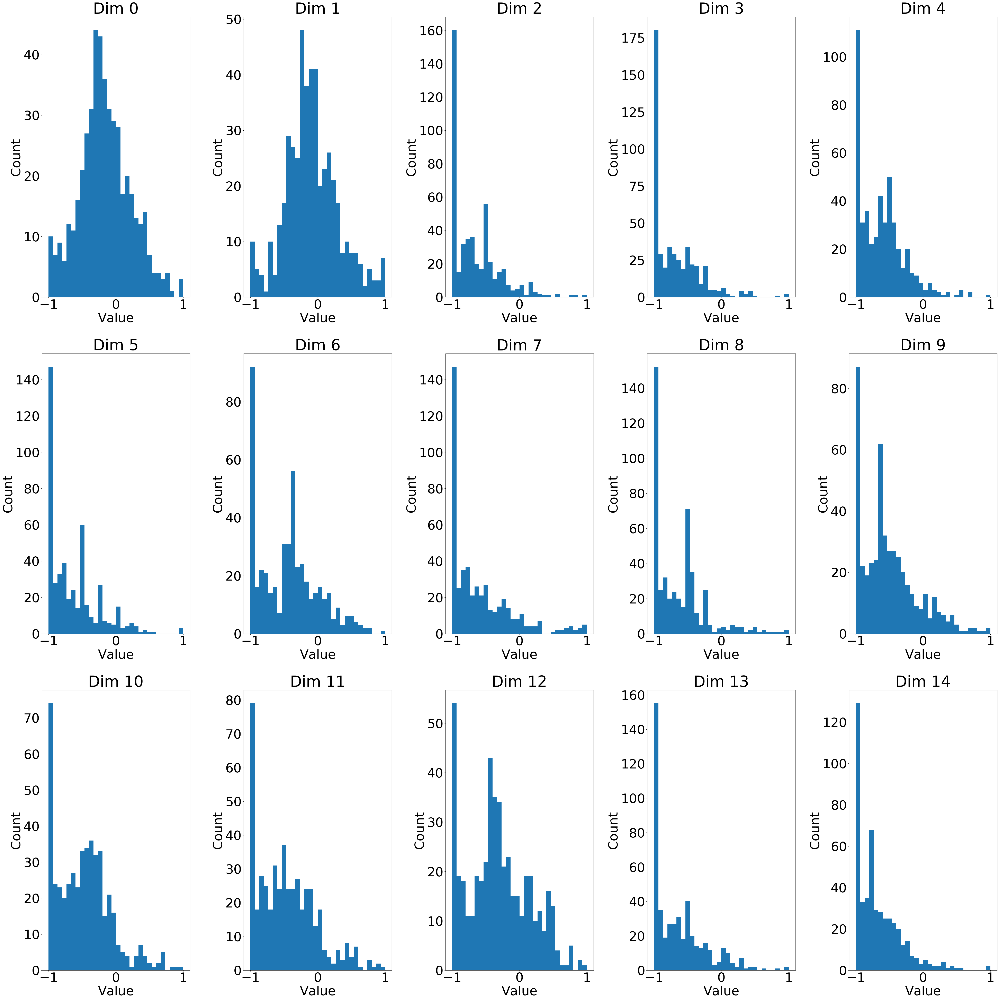

In [15]:
import torch
import matplotlib.pyplot as plt

# labels: torch.Tensor of shape (480, 15)
labels_np = labels.detach().cpu().numpy()

fig, axes = plt.subplots(3, 5, figsize=(50, 50))
axes = axes.ravel()

for j in range(labels_np.shape[1]):
    axes[j].hist(labels_np[:, j], bins=30)
    axes[j].set_title(f"Dim {j}")
    axes[j].set_xlabel("Value")
    axes[j].set_ylabel("Count")

plt.tight_layout()
plt.show()

In [9]:
sagar_tasks

['Intensity',
 'Pleasantness',
 'Fishy',
 'Burnt',
 'Sour',
 'Decayed',
 'Musky',
 'Fruity',
 'Sweaty',
 'Cool',
 'Floral',
 'Sweet',
 'Warm',
 'Bakery',
 'Spicy']

# Directional gradients

Intensity
label_dim=0 | corr(radius, label)=0.4853
label_dim=0 | angle=163.87 degrees | R2_direction=0.0147


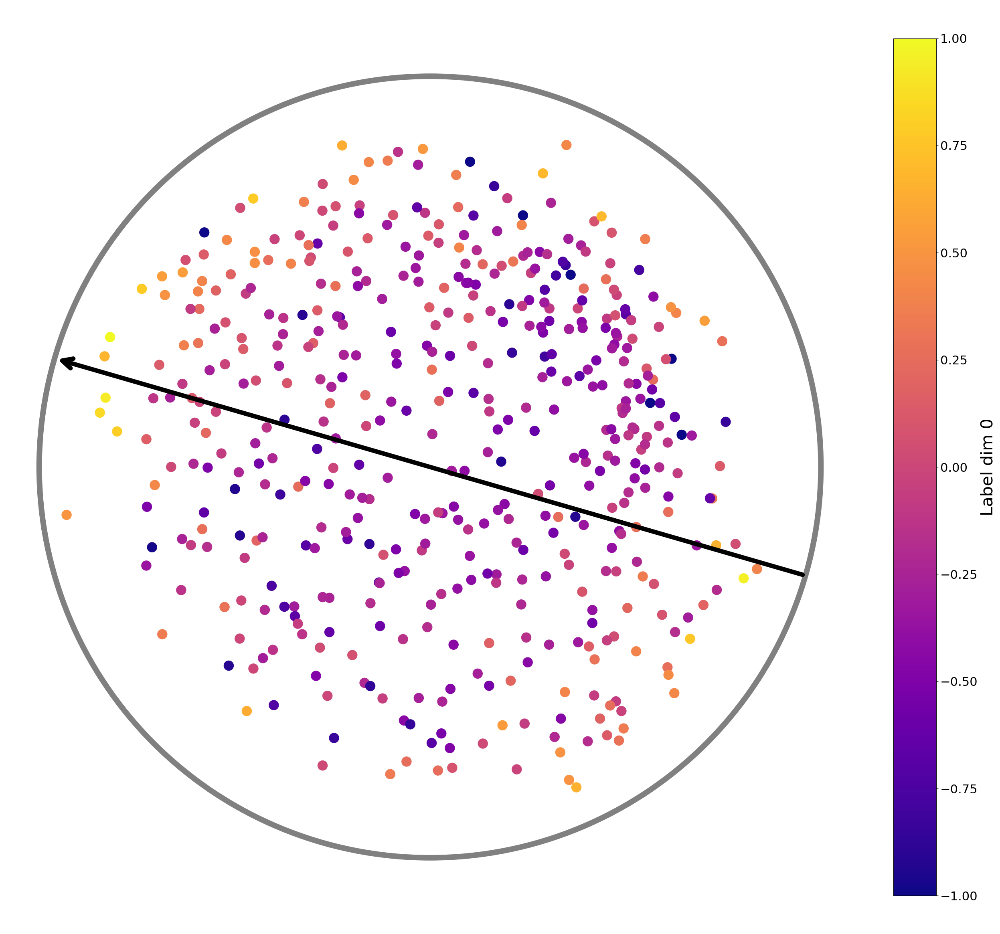

Pleasantness
label_dim=1 | corr(radius, label)=0.1189
label_dim=1 | angle=301.70 degrees | R2_direction=0.3918


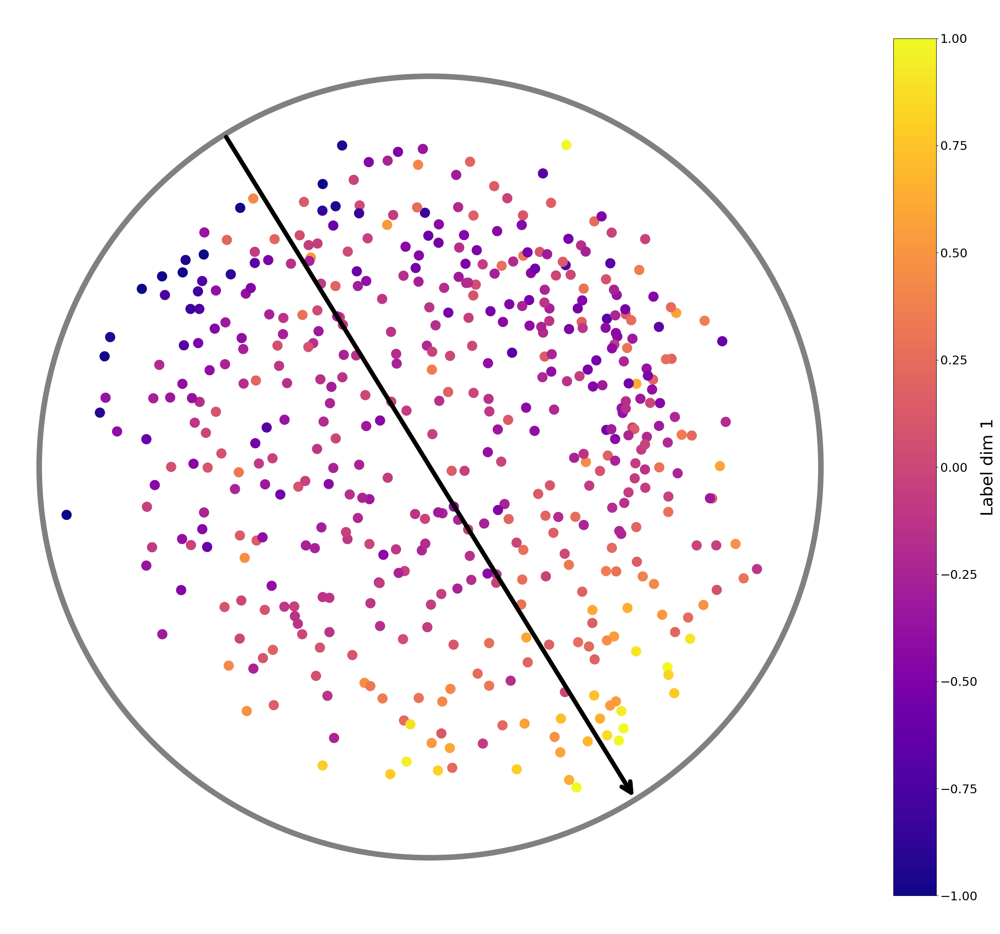

Fishy
label_dim=2 | corr(radius, label)=0.0699
label_dim=2 | angle=170.45 degrees | R2_direction=0.2718


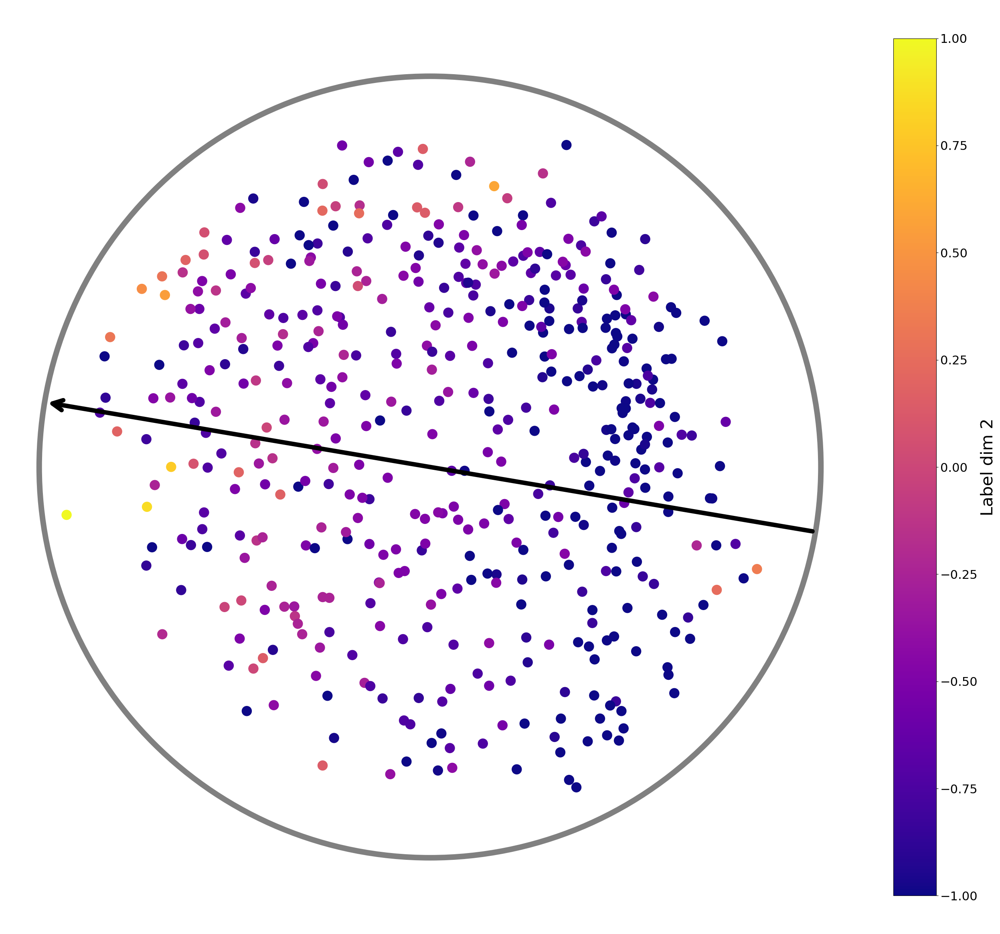

Burnt
label_dim=3 | corr(radius, label)=-0.0005
label_dim=3 | angle=185.41 degrees | R2_direction=0.1807


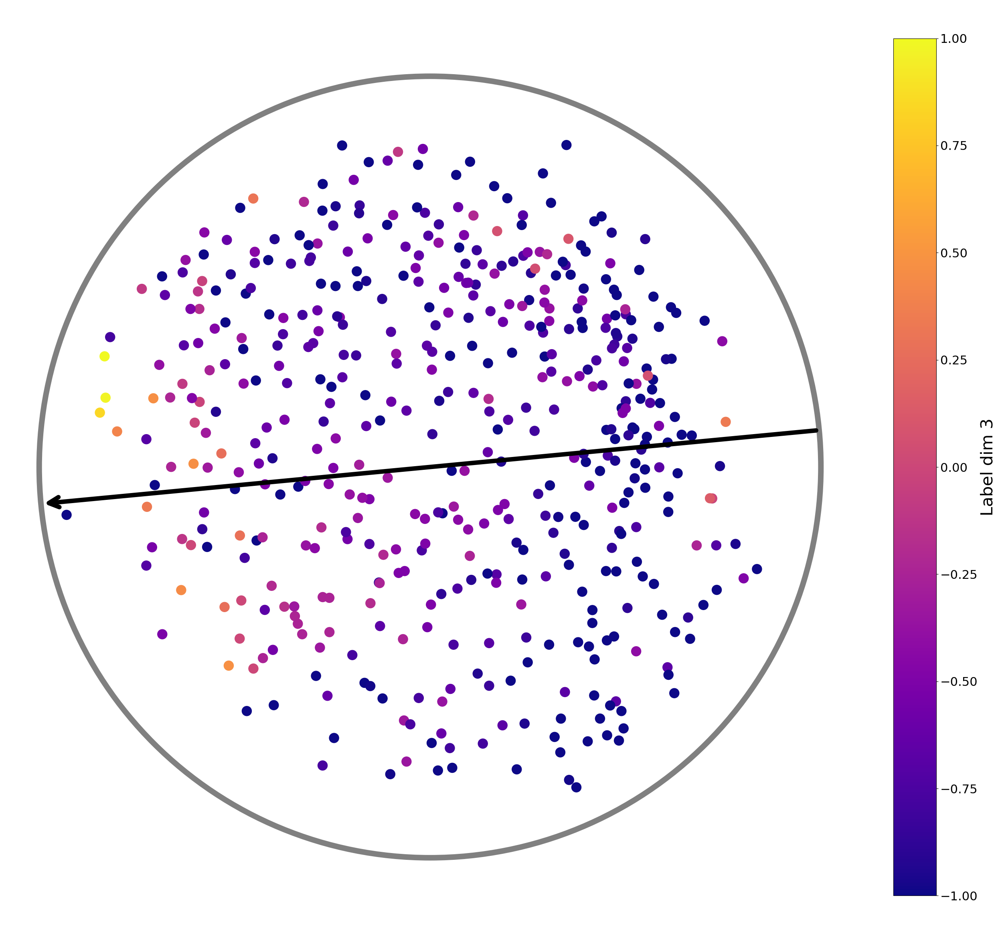

Sour
label_dim=4 | corr(radius, label)=0.0730
label_dim=4 | angle=251.74 degrees | R2_direction=0.0344


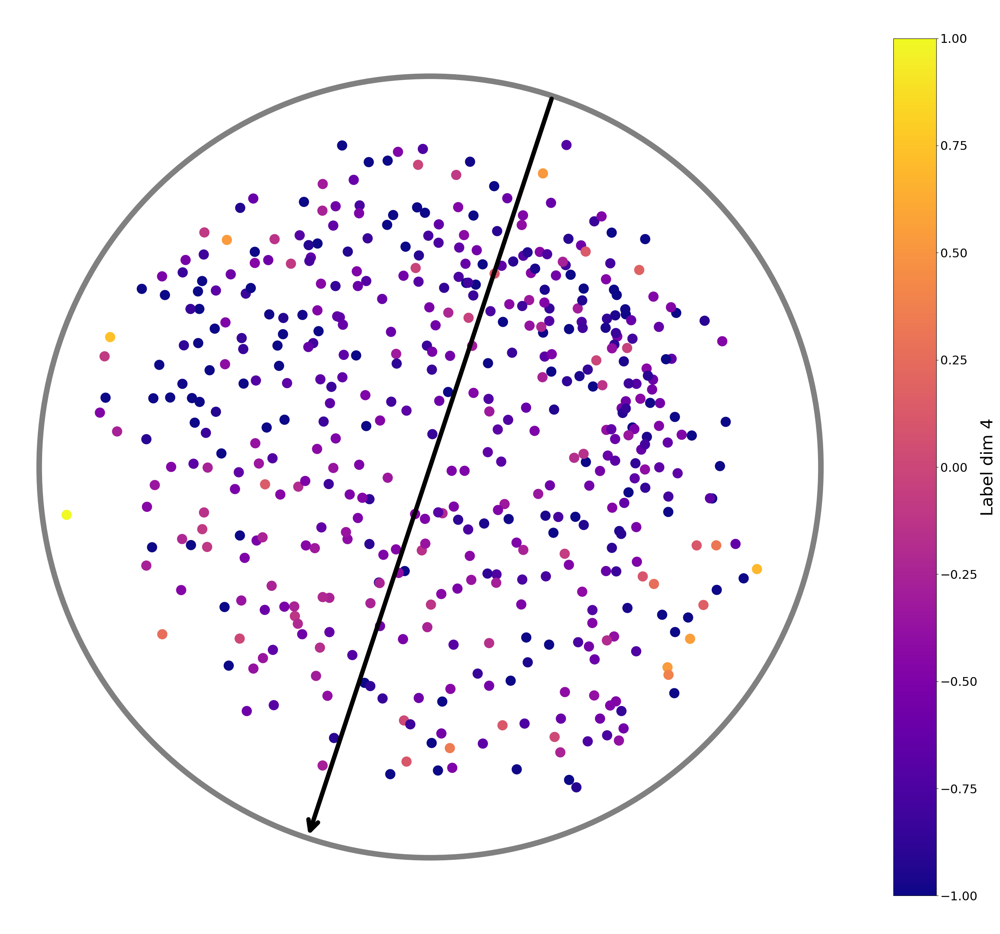

Decayed
label_dim=5 | corr(radius, label)=0.1442
label_dim=5 | angle=175.91 degrees | R2_direction=0.4418


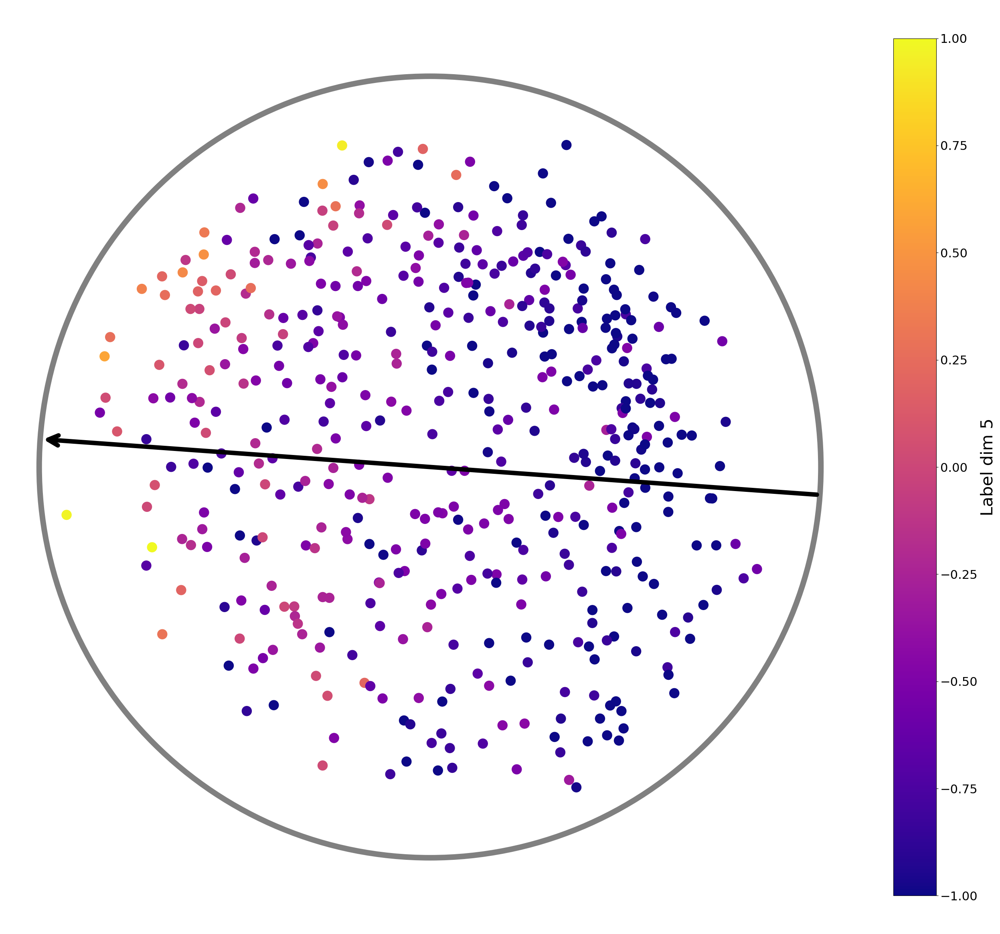

Musky
label_dim=6 | corr(radius, label)=0.1259
label_dim=6 | angle=175.24 degrees | R2_direction=0.5722


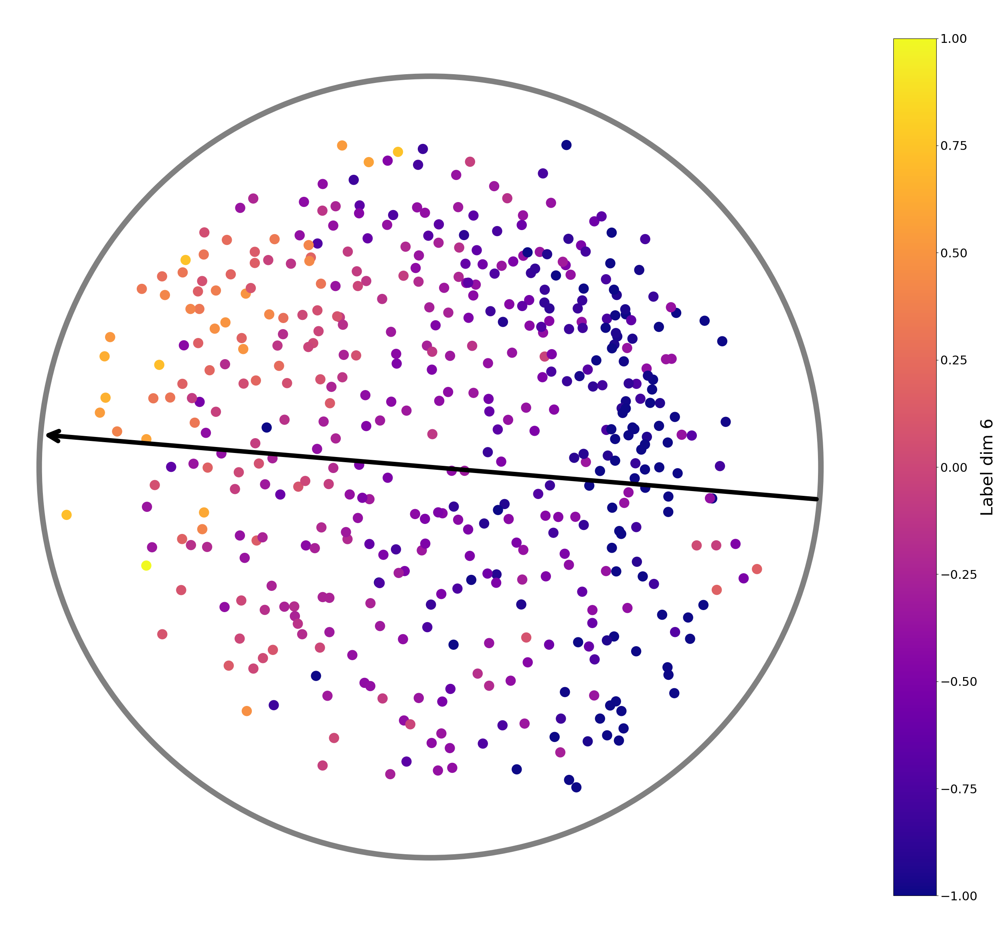

Fruity
label_dim=7 | corr(radius, label)=0.0770
label_dim=7 | angle=296.80 degrees | R2_direction=0.4849


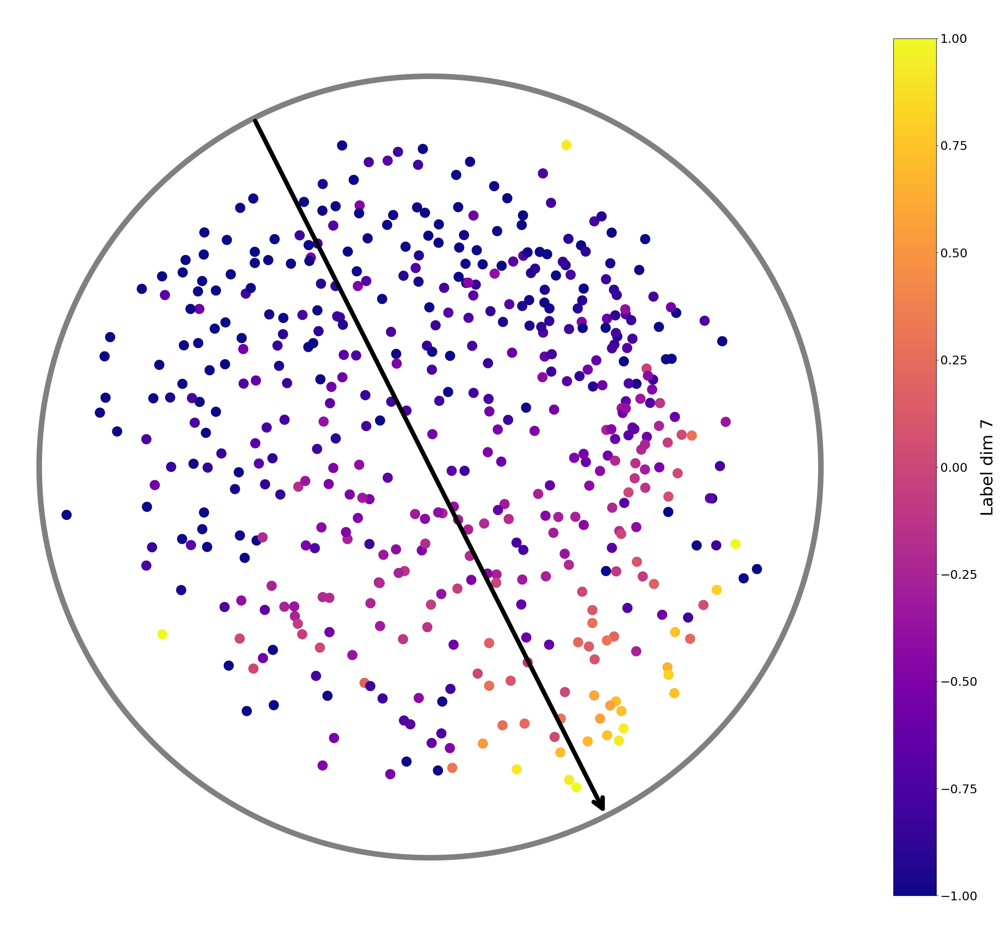

Sweaty
label_dim=8 | corr(radius, label)=0.1186
label_dim=8 | angle=202.88 degrees | R2_direction=0.1826


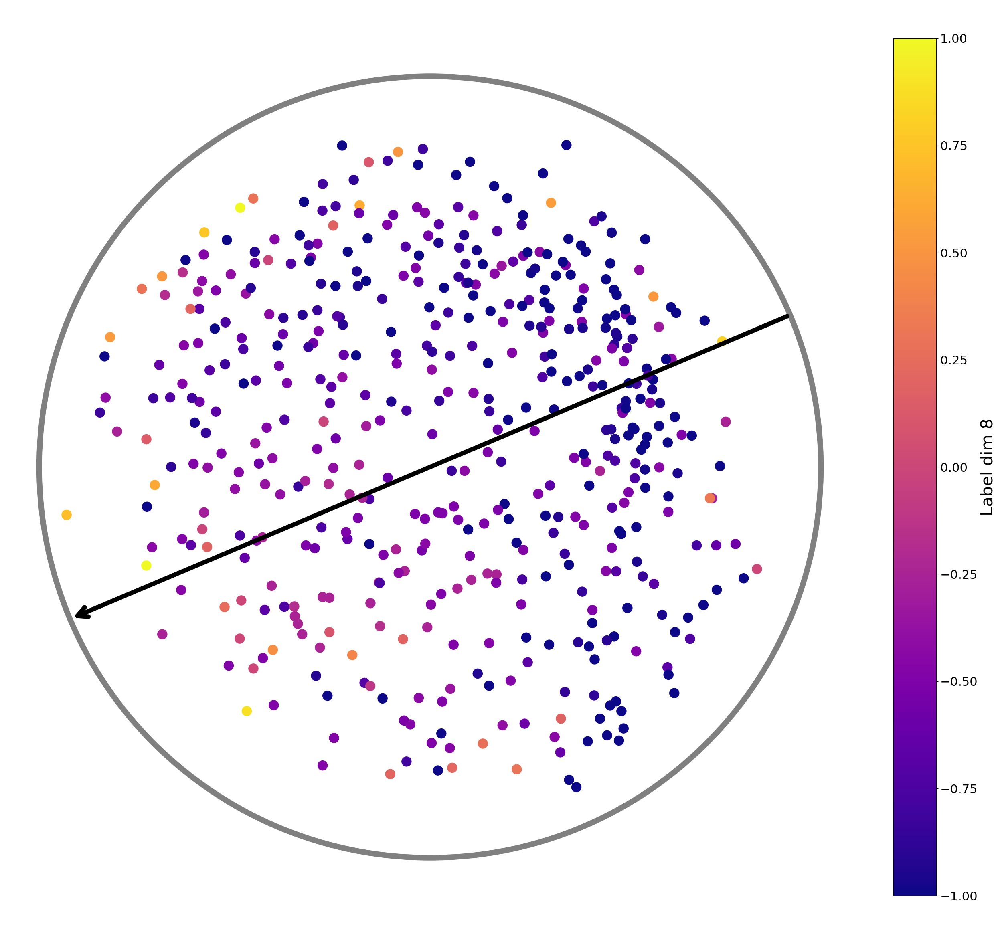

Cool
label_dim=9 | corr(radius, label)=-0.0939
label_dim=9 | angle=344.70 degrees | R2_direction=0.0238


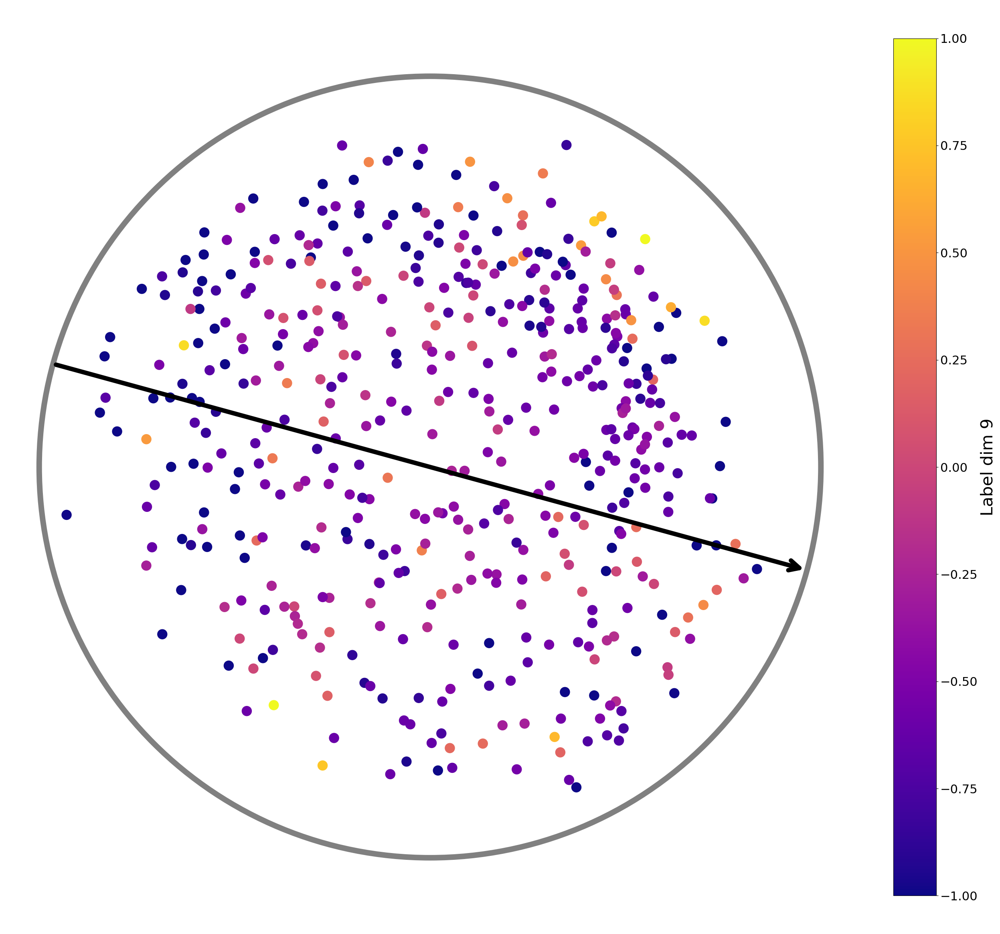

Floral
label_dim=10 | corr(radius, label)=-0.1006
label_dim=10 | angle=263.94 degrees | R2_direction=0.3126


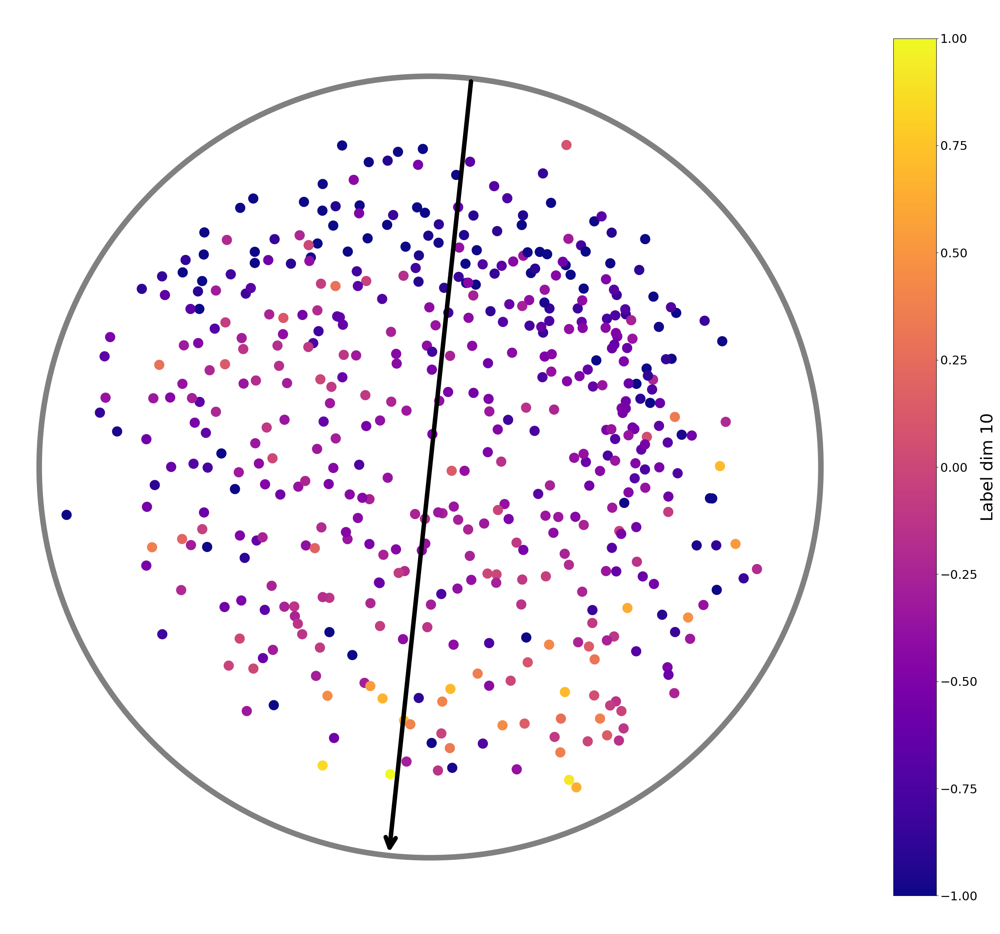

Sweet
label_dim=11 | corr(radius, label)=0.0788
label_dim=11 | angle=291.59 degrees | R2_direction=0.6476


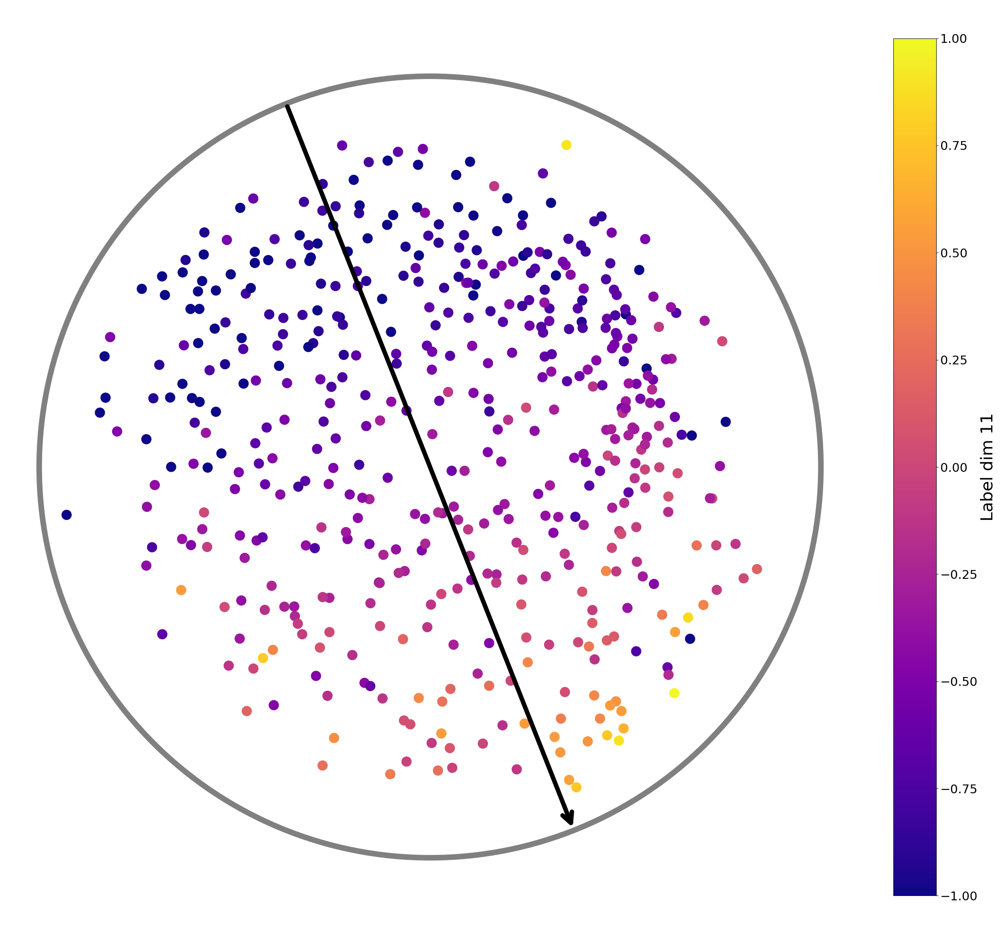

Warm
label_dim=12 | corr(radius, label)=0.1190
label_dim=12 | angle=203.13 degrees | R2_direction=0.1890


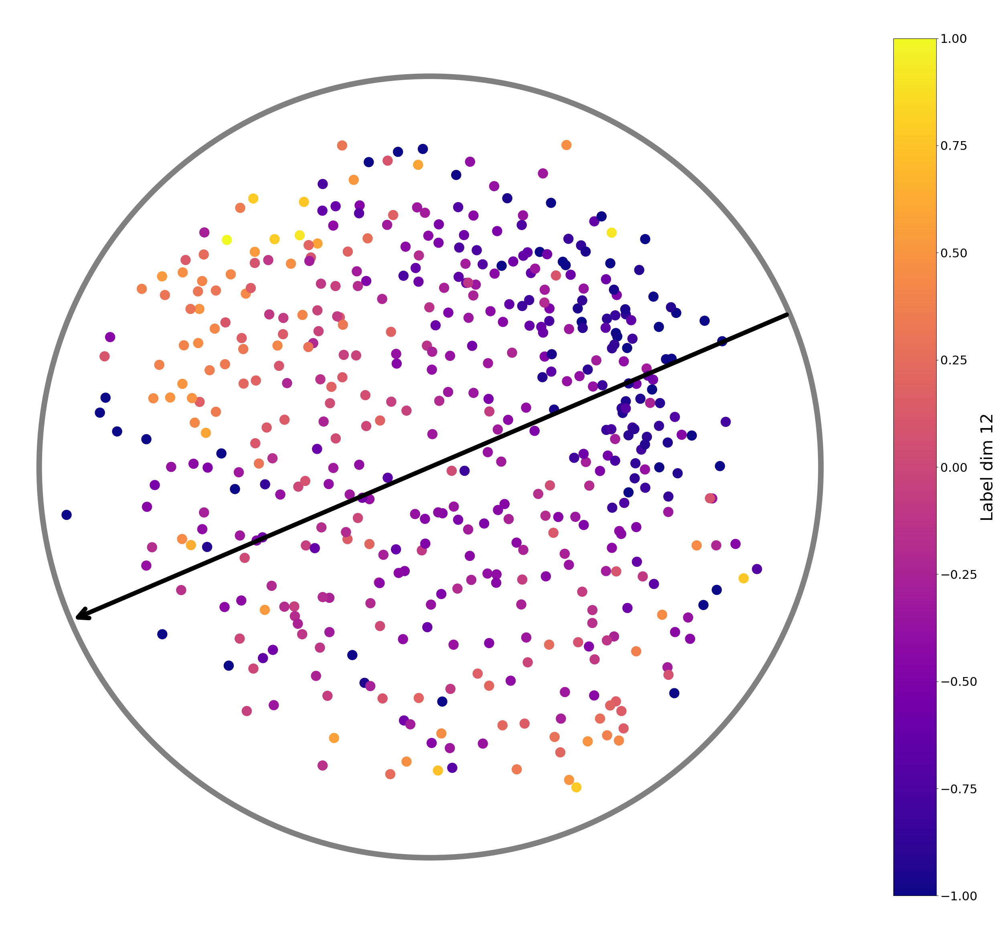

Bakery
label_dim=13 | corr(radius, label)=0.0838
label_dim=13 | angle=259.55 degrees | R2_direction=0.2661


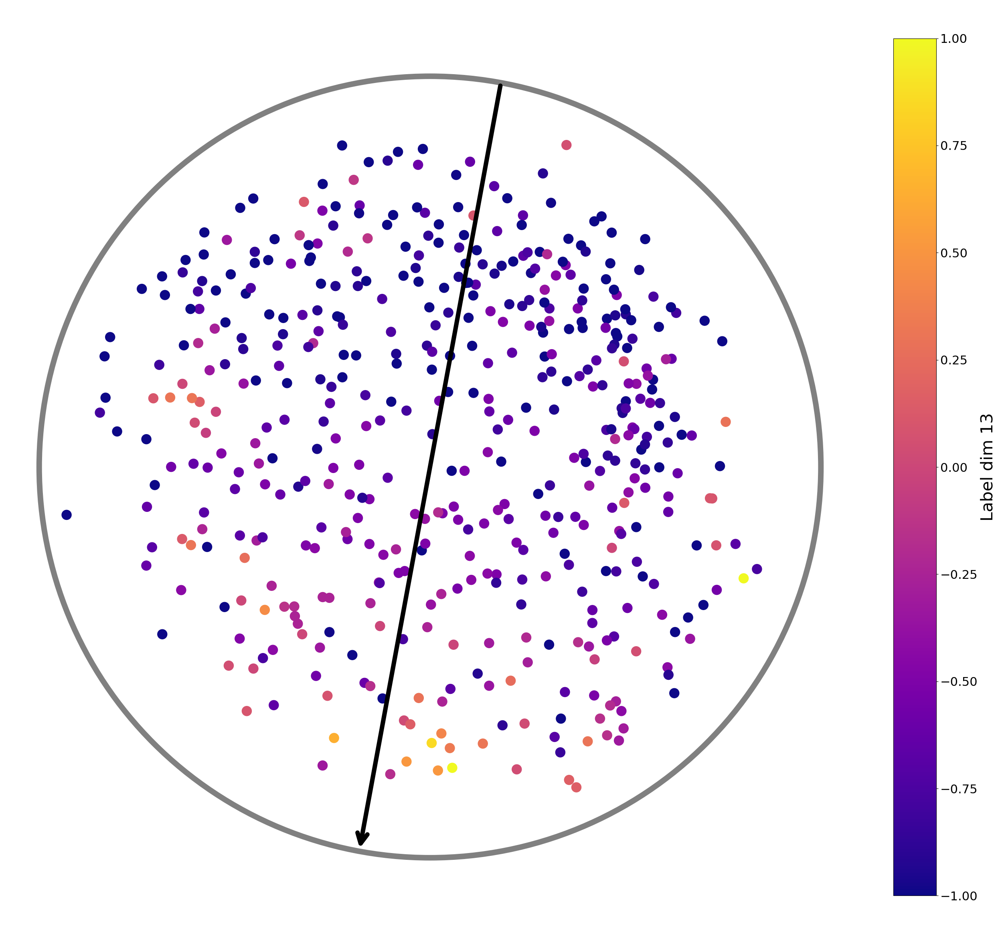

Spicy
label_dim=14 | corr(radius, label)=-0.1256
label_dim=14 | angle=148.51 degrees | R2_direction=0.0286


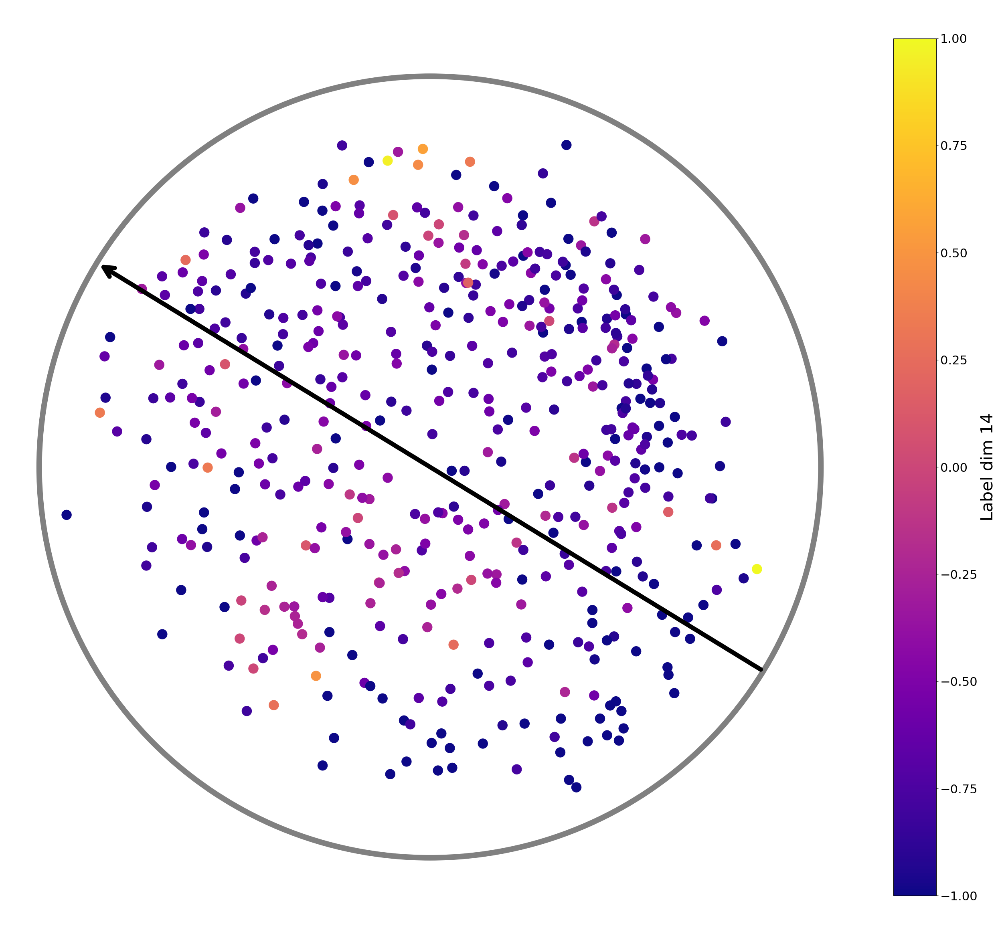

In [7]:
for label_dim in range(len(sagar_tasks)):
    print(sagar_tasks[label_dim])
    scatterplot_2d_new(epch, X, labels.detach(), CIDs, labels, subjects=subjects,
                                color_by='label_dim', label_dim=label_dim, 
                       show_label_gradient=True,
                       shape_by='none',
                                save=False, args=None,
                                hyperbolic_boundary = True,
                                 saving_path=figs_path)

In [9]:
for label_dim in range(len(sagar_tasks)):
    print(sagar_tasks[label_dim])
    scatterplot_2d_new(epch, X, labels.detach(), CIDs, labels, subjects=subjects,
                                color_by='label_dim', label_dim=label_dim, 
                       show_label_gradient=True,
                       shape_by='none',
                                save=True, args=None,
                                hyperbolic_boundary = True,
                                 saving_path=figs_path)

Intensity
label_dim=0 | corr(radius, label)=0.4420
label_dim=0 | angle=248.14 degrees | R2_direction=0.0150
Pleasantness
label_dim=1 | corr(radius, label)=0.1430
label_dim=1 | angle=161.57 degrees | R2_direction=0.3736
Fishy
label_dim=2 | corr(radius, label)=0.0576
label_dim=2 | angle=310.09 degrees | R2_direction=0.1442
Burnt
label_dim=3 | corr(radius, label)=-0.0451
label_dim=3 | angle=275.80 degrees | R2_direction=0.1786
Sour
label_dim=4 | corr(radius, label)=0.0999
label_dim=4 | angle=164.89 degrees | R2_direction=0.0247
Decayed
label_dim=5 | corr(radius, label)=0.0805
label_dim=5 | angle=283.55 degrees | R2_direction=0.2608
Musky
label_dim=6 | corr(radius, label)=0.0373
label_dim=6 | angle=279.97 degrees | R2_direction=0.4291
Fruity
label_dim=7 | corr(radius, label)=0.1420
label_dim=7 | angle=151.22 degrees | R2_direction=0.4455
Sweaty
label_dim=8 | corr(radius, label)=0.1348
label_dim=8 | angle=275.33 degrees | R2_direction=0.0522
Cool
label_dim=9 | corr(radius, label)=-0.0441
la

Pleasantness


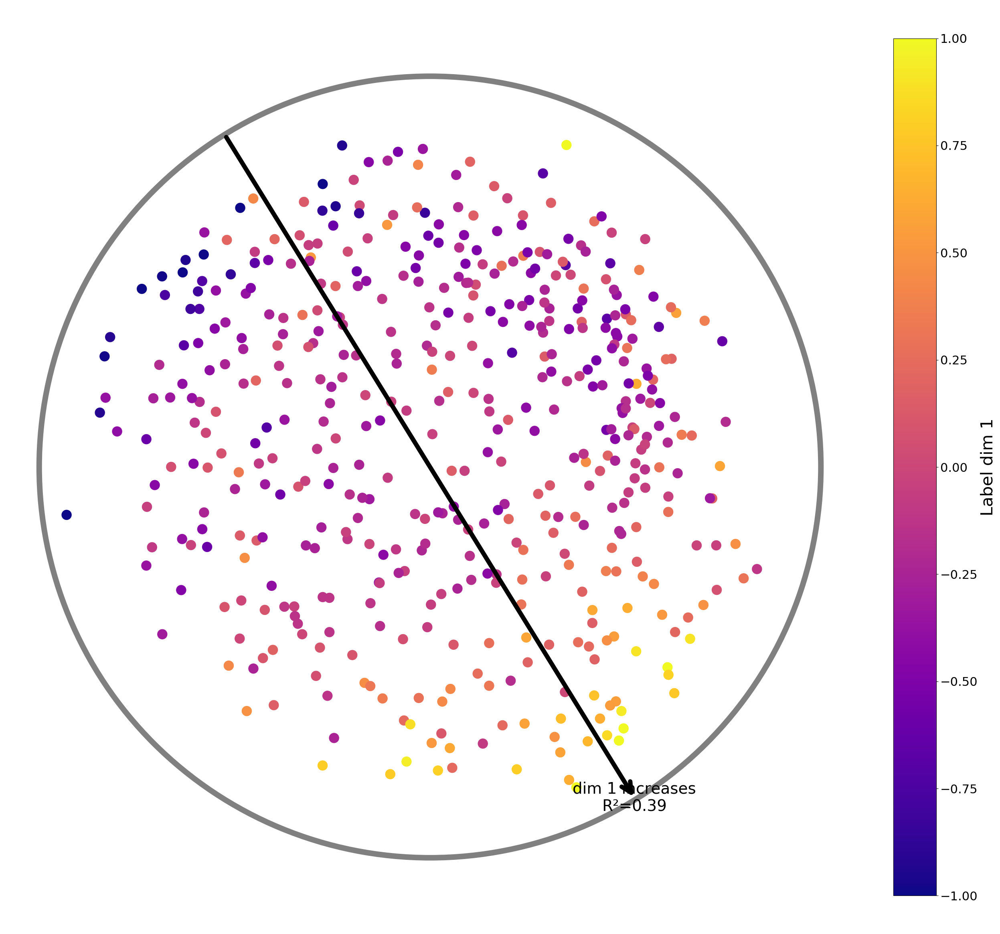

In [12]:
label_dim=1
print(sagar_tasks[label_dim])
scatterplot_2d_new(epch, X, labels.detach(), CIDs, labels, subjects=subjects,
               color_by='label_dim', label_dim=label_dim,
               show_label_gradient=True,
               shape_by='none', save=False, args=None, hyperbolic_boundary = True,
               saving_path=figs_path)

# Intensity

Descriptor: Intensity
Number of valid samples: 480 / 480
Pearson r  = 0.4420, p = 2.249e-24
Spearman ρ = 0.4111, p = 5.373e-21


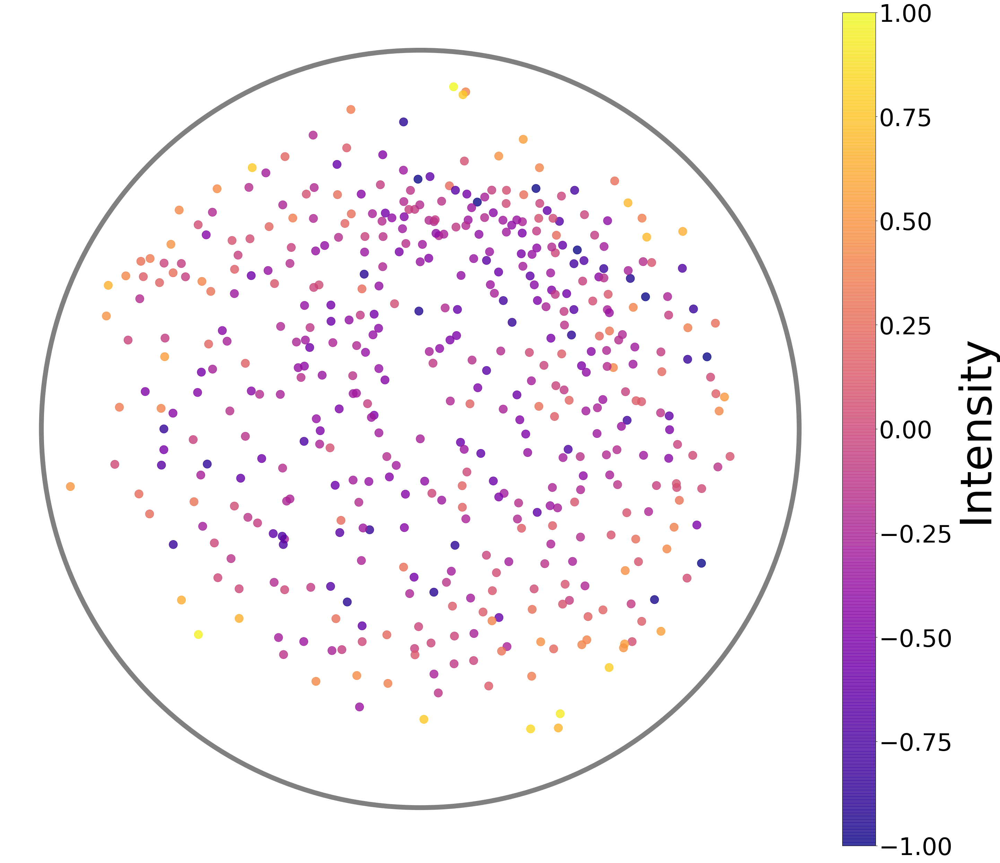

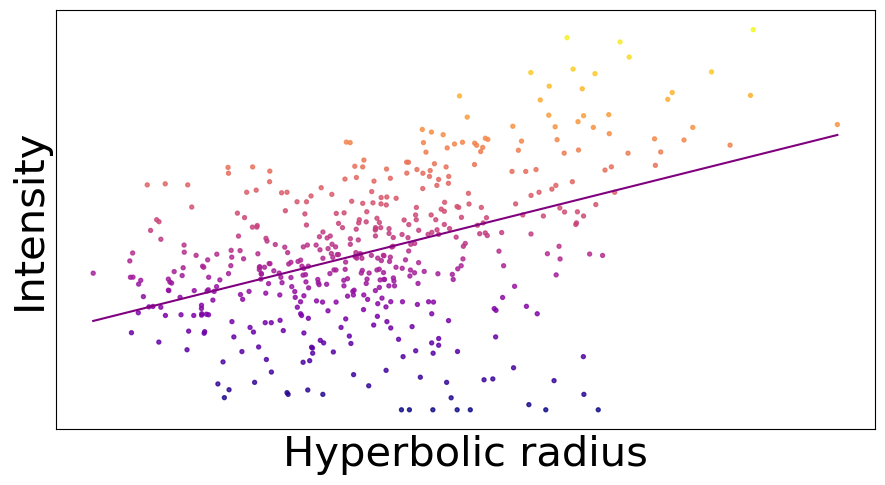

In [98]:
out = plot_embedding_intensity_and_radius_correlation(
    X=X,
    labels=labels,
    radius=radius,
    descriptor_index=0,
    descriptor_name="Intensity",
    title=None,
    save_embedding_path="embedding_intensity.png",
    save_correlation_path="radius_intensity_correlation.png",
)

# Pruning

In [14]:
import numpy as np
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA


# ------------------------------------------------------------
# Helper
# ------------------------------------------------------------

def to_numpy(a):
    if hasattr(a, "detach"):
        return a.detach().cpu().numpy()
    return np.asarray(a)


# ------------------------------------------------------------
# 1. Label correlation matrix
# ------------------------------------------------------------

def compute_label_correlation(y):
    """
    y: shape (n_samples, n_labels)

    For binary labels, Pearson correlation between columns is the phi coefficient.
    """
    y = to_numpy(y).astype(float)

    C = np.corrcoef(y, rowvar=False)

    # Replace NaNs caused by constant labels
    C = np.nan_to_num(C, nan=0.0)

    return C


def plot_label_correlation_matrix(y, label_names=None, figsize=(10, 9)):
    y = to_numpy(y).astype(float)
    C = compute_label_correlation(y)

    n_labels = y.shape[1]

    if label_names is None:
        label_names = [f"label_{i}" for i in range(n_labels)]

    fig, ax = plt.subplots(figsize=figsize, constrained_layout=True)

    im = ax.imshow(C, vmin=-1, vmax=1, cmap="plasma")

    ax.set_title("Label correlation matrix", fontsize=13, pad=12)
    ax.set_xlabel("Labels")
    ax.set_ylabel("Labels")

    # If too many labels, do not show all names
    if n_labels <= 40:
        ax.set_xticks(np.arange(n_labels))
        ax.set_yticks(np.arange(n_labels))
        ax.set_xticklabels(label_names, rotation=90, fontsize=8)
        ax.set_yticklabels(label_names, fontsize=8)
    else:
        ax.set_xticks([])
        ax.set_yticks([])

    cbar = fig.colorbar(im, ax=ax, shrink=0.8)
    cbar.set_label("Pearson correlation")

    plt.show()

    return C 

In [15]:
def print_highly_correlated_pairs(y, label_names=None, threshold=0.8, top_k=50):
    y = to_numpy(y).astype(float)
    C = compute_label_correlation(y)

    n_labels = y.shape[1]

    if label_names is None:
        label_names = [f"label_{i}" for i in range(n_labels)]

    pairs = []

    for i in range(n_labels):
        for j in range(i + 1, n_labels):
            r = C[i, j]
            if abs(r) >= threshold:
                pairs.append((i, j, label_names[i], label_names[j], r))

    pairs = sorted(pairs, key=lambda x: abs(x[4]), reverse=True)

    print(f"Highly correlated pairs, |r| >= {threshold}:")
    for i, j, name_i, name_j, r in pairs[:top_k]:
        print(f"{i:3d} {name_i:25s} -- {j:3d} {name_j:25s}   r = {r:.3f}")

    if len(pairs) > top_k:
        print(f"... showing top {top_k} out of {len(pairs)} pairs")

    return pairs

In [56]:
pairs = print_highly_correlated_pairs(
    labels,
    threshold=0.3,
    top_k=100
) 

Highly correlated pairs, |r| >= 0.3:
  7 label_7                   --  11 label_11                    r = 0.585
  5 label_5                   --   6 label_6                     r = 0.511
  1 label_1                   --  11 label_11                    r = 0.502
  1 label_1                   --   7 label_7                     r = 0.469
  2 label_2                   --   5 label_5                     r = 0.432
  2 label_2                   --   6 label_6                     r = 0.429
  1 label_1                   --   5 label_5                     r = -0.418
 10 label_10                  --  11 label_11                    r = 0.413
  1 label_1                   --  10 label_10                    r = 0.381
  7 label_7                   --  10 label_10                    r = 0.340
 11 label_11                  --  13 label_13                    r = 0.337
  6 label_6                   --   7 label_7                     r = -0.336
  6 label_6                   --   8 label_8                 

In [16]:
def prune_correlated_labels(y, label_names=None, threshold=0.85):
    """
    Greedily removes labels until all remaining pairs satisfy:

        |corr(label_i, label_j)| < threshold

    When two labels are too correlated, removes the one with larger
    average absolute correlation to all other currently kept labels.

    Returns:
        y_pruned
        kept_indices
        removed_indices
        kept_names
        removed_names
    """
    y = to_numpy(y).astype(float)
    C = compute_label_correlation(y)
    absC = np.abs(C)

    n_labels = y.shape[1]

    if label_names is None:
        label_names = [f"label_{i}" for i in range(n_labels)]

    keep = set(range(n_labels))
    removed = []

    while True:
        keep_list = sorted(list(keep))

        # Find all too-correlated pairs among kept labels
        bad_pairs = []
        for a in range(len(keep_list)):
            for b in range(a + 1, len(keep_list)):
                i = keep_list[a]
                j = keep_list[b]
                if absC[i, j] >= threshold:
                    bad_pairs.append((absC[i, j], i, j))

        if len(bad_pairs) == 0:
            break

        # Take the worst pair
        _, i, j = max(bad_pairs, key=lambda x: x[0])

        # Remove the more globally redundant label
        keep_without_i = list(keep - {i})
        keep_without_j = list(keep - {j})

        mean_corr_i = absC[i, keep_without_i].mean() if len(keep_without_i) > 0 else 0
        mean_corr_j = absC[j, keep_without_j].mean() if len(keep_without_j) > 0 else 0

        if mean_corr_i >= mean_corr_j:
            remove = i
        else:
            remove = j

        keep.remove(remove)
        removed.append(remove)

    kept_indices = sorted(list(keep))
    removed_indices = removed

    y_pruned = y[:, kept_indices]

    kept_names = [label_names[i] for i in kept_indices]
    removed_names = [label_names[i] for i in removed_indices]

    print(f"Original number of labels: {n_labels}")
    print(f"Kept labels: {len(kept_indices)}")
    print(f"Removed labels: {len(removed_indices)}")
    print()
    print("Kept indices:")
    print(kept_indices)
    print()
    print("Removed indices:")
    print(removed_indices)

    return y_pruned, kept_indices, removed_indices, kept_names, removed_names

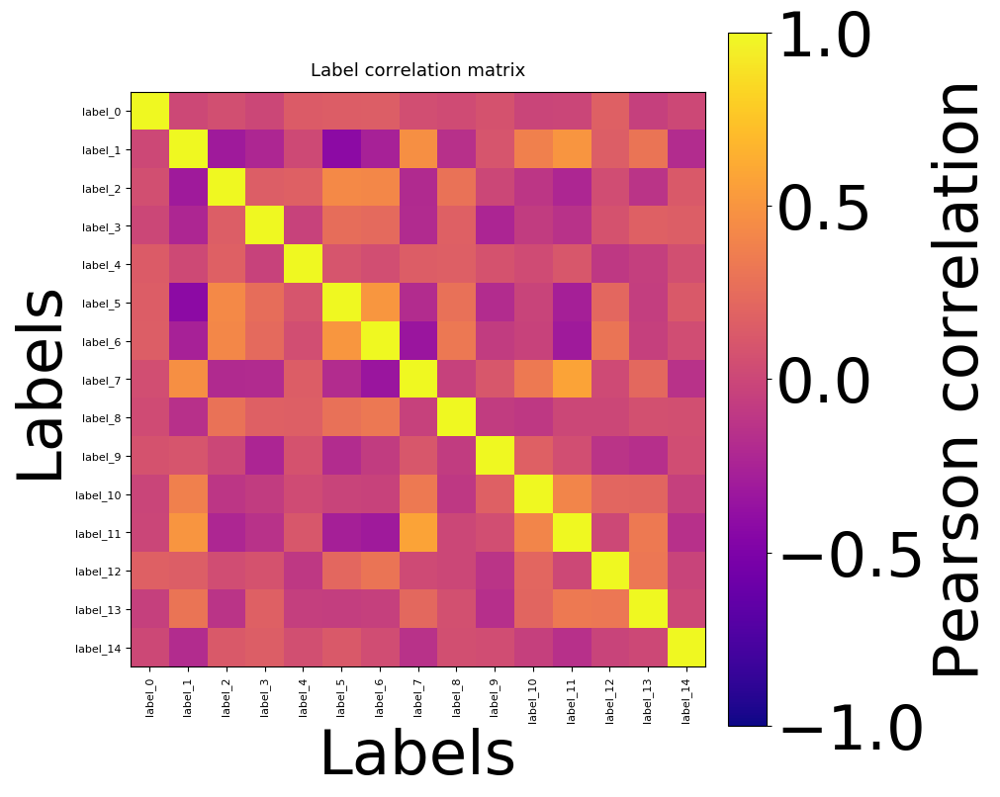

Highly correlated pairs, |r| >= 0.3:
  7 label_7                   --  11 label_11                    r = 0.585
  5 label_5                   --   6 label_6                     r = 0.511
  1 label_1                   --  11 label_11                    r = 0.502
  1 label_1                   --   7 label_7                     r = 0.469
  2 label_2                   --   5 label_5                     r = 0.432
  2 label_2                   --   6 label_6                     r = 0.429
  1 label_1                   --   5 label_5                     r = -0.418
 10 label_10                  --  11 label_11                    r = 0.413
  1 label_1                   --  10 label_10                    r = 0.381
  7 label_7                   --  10 label_10                    r = 0.340
 11 label_11                  --  13 label_13                    r = 0.337
  6 label_6                   --   7 label_7                     r = -0.336
  6 label_6                   --   8 label_8                 

/home/aniss/anaconda3/envs/hyper_wrapped_dca_copy/lib/python3.7/site-packages/ipykernel_launcher.py:253: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 


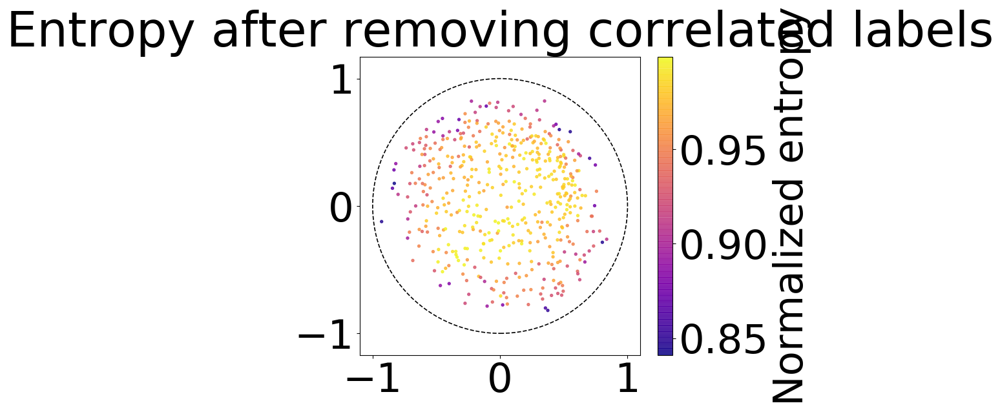

/home/aniss/anaconda3/envs/hyper_wrapped_dca_copy/lib/python3.7/site-packages/ipykernel_launcher.py:280: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 


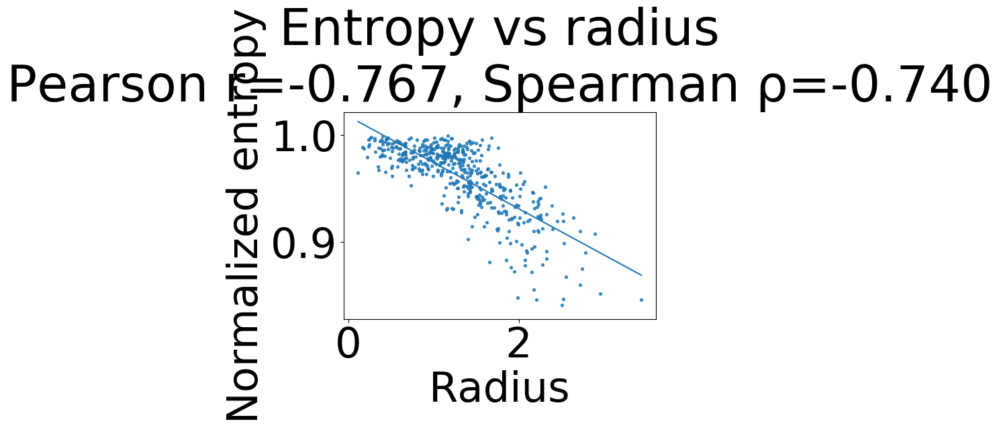

In [29]:
C = plot_label_correlation_matrix(labels) 

pairs = print_highly_correlated_pairs(
    labels,
    threshold=0.3
)

y_pruned, kept_idx, removed_idx, kept_names, removed_names = prune_correlated_labels(
    labels,
    threshold=0.3
)

results_pruned = plot_embedding_entropy_and_radius_correlation(
    X=X,
    y=y_pruned,
    radius=radius,
    entropy_method="softmax",
    normalize_entropy=True,
    title="Entropy after removing correlated labels"
)

# Angular Heatmap 

In [27]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

data = {
    "Descriptor": [
        "Intensity", "Pleasantness", "Fishy", "Burnt", "Sour",
        "Decayed", "Musky", "Fruity", "Sweaty", "Cool",
        "Floral", "Sweet", "Warm", "Bakery", "Spicy"
    ],
    "Subject 1": [
        0.0349, 0.3610, 0.1418, 0.2152, 0.0633,
        0.1658, 0.3347, 0.3370, 0.0840, 0.0861,
        0.2444, 0.3394, 0.1575, 0.2415, 0.0539
    ],
    "Subject 2": [
        0.0811, 0.7307, 0.3292, 0.3211, 0.2075,
        0.5467, 0.6784, 0.7364, 0.2361, 0.4232,
        0.3059, 0.7694, 0.4552, 0.3315, 0.1285
    ],
    "Subject 3": [
        0.0313, 0.3369, 0.5127, 0.2937, 0.1669,
        0.5317, 0.6775, 0.5299, 0.5334, 0.1900,
        0.4013, 0.6099, 0.4504, 0.3531, 0.2926
    ],
    "Averaged ratings": [
        0.0630, 0.7253, 0.4788, 0.3374, 0.0730,
        0.5084, 0.6577, 0.6346, 0.2378, 0.2699,
        0.3912, 0.6725, 0.2043, 0.2821, 0.0957
    ],
}

df = pd.DataFrame(data)

# Optional: sort descriptors by averaged-rating R2
df = df.sort_values("Averaged ratings", ascending=False)

values = df[["Subject 1", "Subject 2", "Subject 3", "Averaged ratings"]].values

fig, ax = plt.subplots(figsize=(7.2, 5.2))
im = ax.imshow(values, aspect="auto", cmap="plasma")

ax.set_xticks(np.arange(values.shape[1]))
#ax.set_xticklabels(["Subject 1", "Subject 2", "Subject 3", "Averaged ratings"])
ax.set_xticklabels(
    ["Subject 1", "Subject 2", "Subject 3", "Averaged ratings"],
    rotation=30,
    ha="right"
)

ax.set_yticks(np.arange(values.shape[0]))
ax.set_yticklabels(df["Descriptor"].values)

ax.tick_params(axis="x", labelsize=12)
ax.tick_params(axis="y", labelsize=12) 

for i in range(values.shape[0]):
    for j in range(values.shape[1]):
        ax.text(j, i, f"{values[i, j]:.2f}", ha="center", va="center", fontsize=10)

cbar = plt.colorbar(im, ax=ax)
cbar.set_label("Directional $R^2$", fontsize=20) 
cbar.ax.tick_params(labelsize=10) 

#ax.set_title("Angular descriptor organization by subject and averaged ratings")
plt.tight_layout()
plt.savefig("subject_average_angular_R2_heatmap.png", dpi=300, bbox_inches="tight", pad_inches=0)
plt.savefig("subject_average_angular_R2_heatmap.pdf", bbox_inches="tight", pad_inches=0)
plt.close()